# Exploratory Data Analysis

In [8]:
from datasets import DatasetDict
from datasets import concatenate_datasets
from transformers import BertTokenizer, GPT2Tokenizer
from models.HybridModel import HybridModel
import tensorflow as tf

from utils.data_preprocessing import get_article_and_highlights_by_id, remove_similar_articles, hierarchical_tokenization, replace_urls, preprocess_dataset, create_tf_dataset, load_tokenized_data, load_raw_data
from utils.path_utils import get_project_root, merge_paths
import re
from nltk import FreqDist, word_tokenize
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from collections import Counter
import matplotlib.pyplot as plt
import pickle
from pathlib import Path

In [2]:
import importlib
import utils
importlib.reload(utils.data_preprocessing)
importlib.reload(utils.path_utils)
# importlib.reload(HybridModel)

<module 'utils.path_utils' from 'C:\\Users\\PC\\PycharmProjects\\TLDR\\utils\\path_utils.py'>

## Dataset

In [11]:
dataset_dict = DatasetDict.load_from_disk("/Users/PC/PycharmProjects/TLDR/scripts/SummarizationDataset/cnn_dailymail")
train_dataset = dataset_dict['train']
test_dataset = dataset_dict['test']
val_dataset = dataset_dict['validation']

ValueError: Expected a list of Dataset objects or a list of IterableDataset objects, but element at position 0 is a list.

## Dataset Description 

In [13]:
train_dataset.info.description

[{'article': 'LONDON, England (Reuters) -- Harry Potter star Daniel Radcliffe gains access to a reported £20 million ($41.1 million) fortune as he turns 18 on Monday, but he insists the money won\'t cast a spell on him. Daniel Radcliffe as Harry Potter in "Harry Potter and the Order of the Phoenix" To the disappointment of gossip columnists around the world, the young actor says he has no plans to fritter his cash away on fast cars, drink and celebrity parties. "I don\'t plan to be one of those people who, as soon as they turn 18, suddenly buy themselves a massive sports car collection or something similar," he told an Australian interviewer earlier this month. "I don\'t think I\'ll be particularly extravagant. "The things I like buying are things that cost about 10 pounds -- books and CDs and DVDs." At 18, Radcliffe will be able to gamble in a casino, buy a drink in a pub or see the horror film "Hostel: Part II," currently six places below his number one movie on the UK box office cha

## Dataset Sample Size

In [14]:
len(train_dataset) + len(test_dataset) + len(val_dataset)

149573

## Data Sample

In [15]:
batch = train_dataset.shuffle(seed=1).select(range(1))
for i, example in enumerate(batch):
    print(f"Id: {example['id']}")
    print(f"Article: {example['article']}")
    print(f"Highlight: {example['highlights']}")

AttributeError: 'list' object has no attribute 'shuffle'

## Training Set Structure:

In [7]:
train_dataset

Dataset({
    features: ['article', 'highlights', 'id'],
    num_rows: 287113
})

## Missing Values

In [8]:
# Check for missing values in articles and summaries for each split (train, test, validation)
for split, dataset in dataset_dict.items():
    missing_articles = sum(x['article'] is None for x in dataset)
    missing_summaries = sum(x['highlights'] is None for x in dataset)

    print(f"For {split} dataset:")
    print(f"Missing articles: {missing_articles}")
    print(f"Missing summaries: {missing_summaries}")

    if missing_articles > 0 or missing_summaries > 0:
        print(f"Missing values detected in {split} dataset")
    else:
        print(f"No missing values detected in {split} dataset")


For train dataset:
Missing articles: 0
Missing summaries: 0
No missing values detected in train dataset
For validation dataset:
Missing articles: 0
Missing summaries: 0
No missing values detected in validation dataset
For test dataset:
Missing articles: 0
Missing summaries: 0
No missing values detected in test dataset


## Duplicated Data

In [9]:
for split, dataset in dataset_dict.items():
    article_dict = {}
    summary_dict = {}
    id_to_index_dict = {}
    duplicate_article_ids = []
    duplicate_summary_ids = []

    for index, x in enumerate(dataset):
        article_id = x.get('id', None)  # Assuming the ID field is named 'id'
        id_to_index_dict[article_id] = index

        # Normalize the text (trim spaces, make lowercase)
        article = x['article'].strip().lower()
        summary = x['highlights'].strip().lower()

        # Check for duplicated articles
        if article in article_dict:
            original_index = id_to_index_dict[article_dict[article]]
            duplicate_article_ids.append((article_id, article_dict[article]))
        else:
            article_dict[article] = article_id

        # Check for duplicated summaries
        if summary in summary_dict:
            original_index = id_to_index_dict[summary_dict[summary]]
            duplicate_summary_ids.append((article_id, summary_dict[summary]))
        else:
            summary_dict[summary] = article_id

    # Remove duplicate IDs by converting to a set and then back to a list
    duplicate_article_ids = list(set(duplicate_article_ids))
    duplicate_summary_ids = list(set(duplicate_summary_ids))


In [10]:
# duplicate example
duplicated_1 = get_article_and_highlights_by_id(dataset_dict, 'b48b637288059e955dca16d8cef74f5f8c603d1a')

if duplicated_1:
    print(f"Found in {duplicated_1['split']} dataset:")
    print(f"Article: {duplicated_1['article']}")
    print(f"Highlights: {duplicated_1['highlights']}")
else:
    print("ID not found in any dataset.")
    
duplicated_2 = get_article_and_highlights_by_id(dataset_dict, 'c9e9f2ef48ce6f20179df3c129568cfb1989c584')

if duplicated_2:
    print(f"Found in {duplicated_2['split']} dataset:")
    print(f"Article: {duplicated_2['article']}")
    print(f"Highlights: {duplicated_2['highlights']}")
else:
    print("ID not found in any dataset.")

Found in train dataset:
Article: Those who like to walk on the Wild West side will no doubt be intrigued to learn that one of Buffalo Bill’s favorite guns is going up for auction, almost 100 years after his death. The legendary showman - real name William Cody - bought the six-shooter revolver in 1883, the same year he launched his circus-style travelling show, which famously featured Sioux Indian Sitting Bull. He was one of the most iconic characters from the American Old West era and was a contemporary of Calamity Jane and Wild Bill Hickok. Auction that's bound to trigger interest: One of Buffalo Bill's favorite guns with which he used to wow crowds in his famous Wild West show is up for sale . The legendary showman bought the six-shooter revolver in 1883 . Although unremarkable to look at, the gun became one of Cody's favourite firearms and was among the few he still owned at the time of his death aged 70 in 1917 from kidney failure. Cody, who earned his nickname hunting buffalo as 

## Standardize text data

In [20]:
# Replacing URLs in the 'article' field of each entry in new_test_data and normalize text
for entry in train_dataset:
    entry['article'] = replace_urls(entry['article'], replacement='[url]').lower()
    entry['highlights'] = entry['highlights'].lower()

## Remove similar articles

In [12]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
new_train_dataset = remove_similar_articles(train_dataset, stop_words=stop_words)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
Checking for similar articles: 100%|██████████| 575/575 [3:26:10<00:00, 21.51s/it]  


In [10]:
# Specify the file path for saving the dataset
file_path = merge_paths(get_project_root(),  'datasets/preprocessed_training_data.pkl')

# Save the dataset using pickle
with open(file_path, 'wb') as file:
    pickle.dump(new_train_dataset, file)

NameError: name 'new_train_dataset' is not defined

In [11]:
import pickle

# Specify the file path for loading the dataset
file_path = merge_paths(get_project_root(),  'datasets/preprocessed_training_data.pkl')

# Load the dataset using pickle
with open(file_path, 'rb') as file:
    new_train_dataset = pickle.load(file)


EOFError: Ran out of input

In [21]:
new_train_dataset

In [14]:
len(new_train_dataset)

137875

## Distribution Analysis 


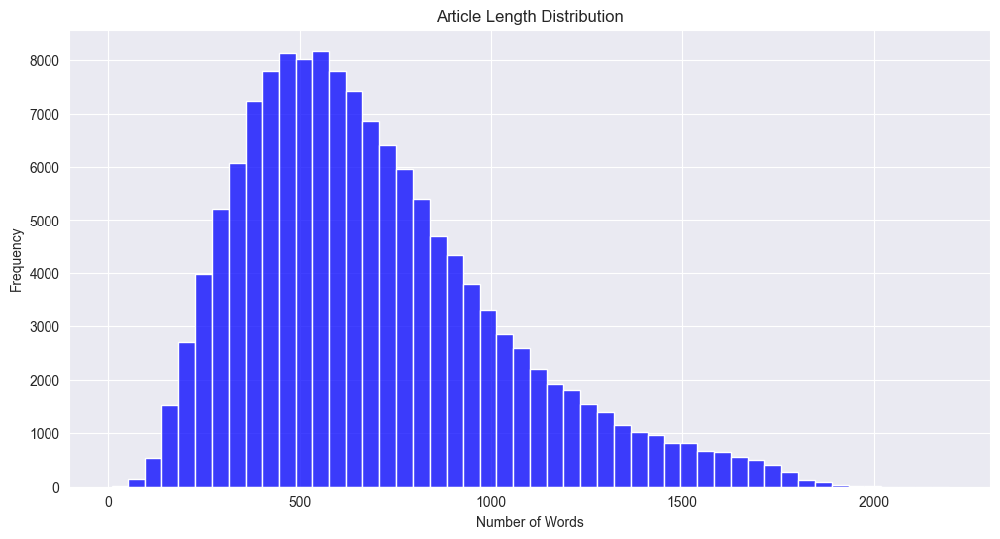

In [15]:
article_lengths = [len(entry['article'].split()) for entry in new_train_dataset]

plt.figure(figsize=(12, 6))
sns.histplot(article_lengths, bins=50, kde=False, color='blue')
plt.title("Article Length Distribution")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.show()


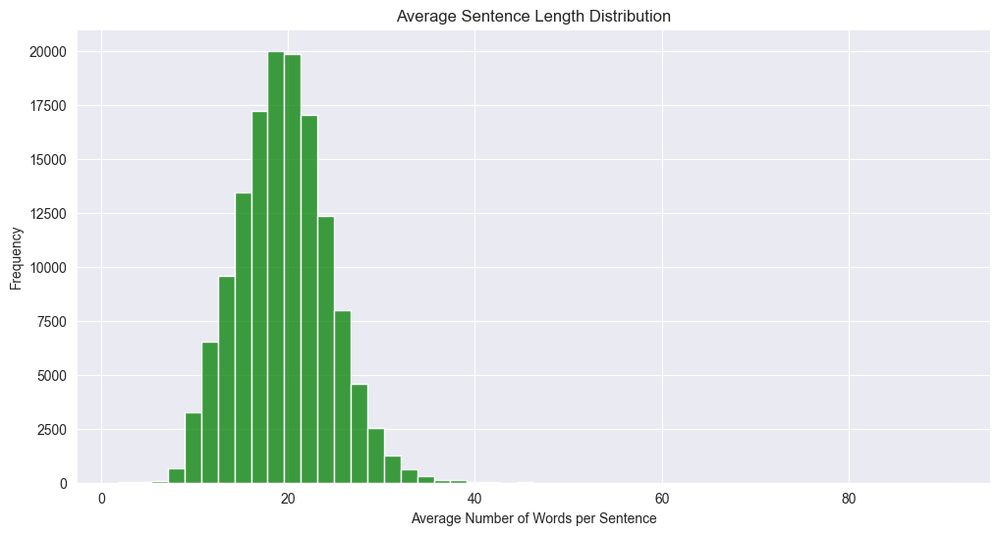

In [16]:
# Function to compute average sentence length in an article
def average_sentence_length(article):
    # Splitting sentences based on various ending punctuations
    sentences = re.split('[.!?] |\.{3} ', article)
    total_sentences = len(sentences)
    total_words = sum(len(sentence.split()) for sentence in sentences)
    return total_words / total_sentences if total_sentences > 0 else 0

# Assuming 'new_train_dataset' is a list of dictionaries, each containing 'id', 'article', and 'highlights'
avg_sentence_lengths = [average_sentence_length(entry['article']) for entry in new_train_dataset]

plt.figure(figsize=(12, 6))
sns.histplot(avg_sentence_lengths, bins=50, kde=False, color='green')
plt.title("Average Sentence Length Distribution")
plt.xlabel("Average Number of Words per Sentence")
plt.ylabel("Frequency")
plt.show()


In [17]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [18]:
# Tokenize words from all articles
all_words = [word for entry in new_train_dataset for word in word_tokenize(entry['article'].lower())]

tokens = [word for word in all_words if word.isalpha()]
# Vocabulary size
vocab_size = len(set(tokens))
print(f"Vocabulary size: {vocab_size}")

Vocabulary size: 297746


Most Common Words: [('the', 5388090), ('to', 2576906), ('a', 2313901), ('and', 2214603), ('of', 2191309), ('in', 1963076), ('was', 928302), ('that', 899599), ('for', 886103), ('on', 822983)]


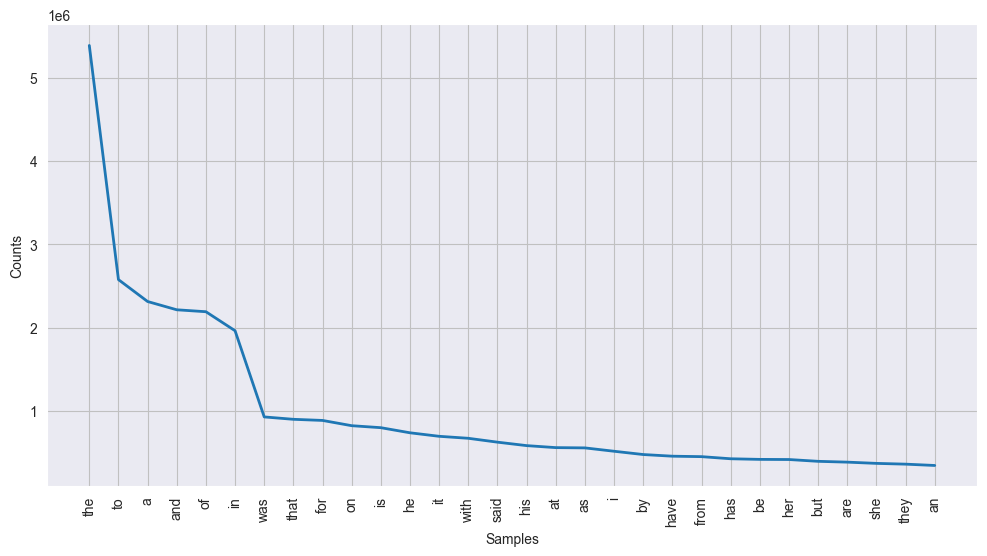

In [19]:

# Frequency Distribution
fdist = FreqDist(tokens)
print(f"Most Common Words: {fdist.most_common(10)}")

# Plot the frequency distribution of the 30 most common words
plt.figure(figsize=(12, 6))
fdist.plot(30, cumulative=False)
plt.show()

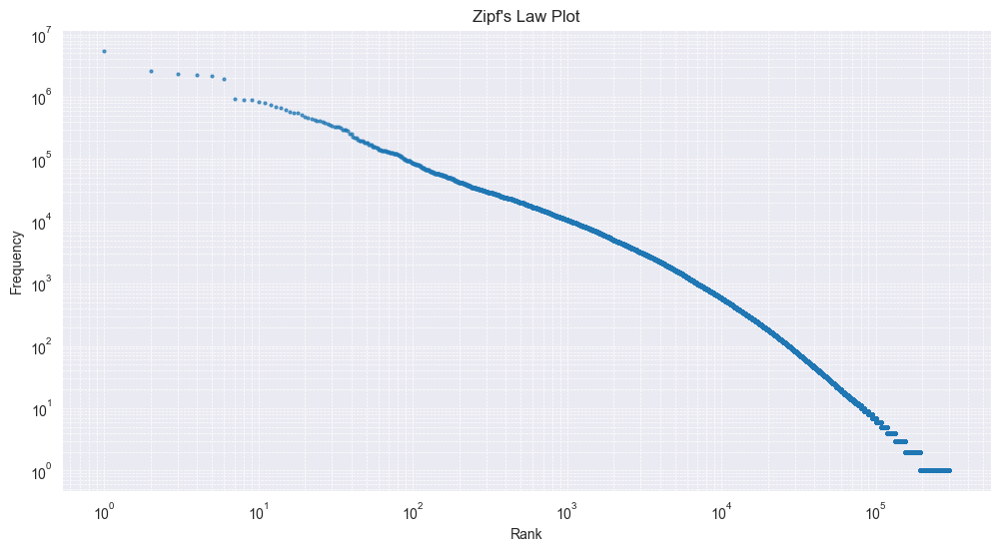

In [20]:
# Frequency distribution
word_freq = Counter(tokens)

# Sort by frequency
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# Extract frequencies for plotting
frequencies = [freq for word, freq in sorted_word_freq]

# Create the plot
plt.figure(figsize=(12, 6))
plt.loglog(range(1, len(frequencies) + 1), frequencies, marker="o", markersize=2, alpha=0.7, linestyle='None')
plt.title("Zipf's Law Plot")
plt.xlabel("Rank")
plt.ylabel("Frequency")
plt.grid(True, which="both", linestyle="--", linewidth=0.5)

plt.show()

## Data Tokenization

In [22]:
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# If the BERT tokenizer doesn't have a padding token, set one.
if not bert_tokenizer.pad_token:
    bert_tokenizer.add_special_tokens({'pad_token': '[PAD]'})

gpt2_tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

# If the GPT-2 tokenizer doesn't have a padding token, set one.
if not gpt2_tokenizer.pad_token:
    gpt2_tokenizer.add_special_tokens({'pad_token': '<|pad|>'})  # Using a unique token to avoid potential conflicts

tokenized_data = hierarchical_tokenization(new_train_dataset, bert_tokenizer=bert_tokenizer, gpt2_tokenizer=gpt2_tokenizer)

Using pad_token, but it is not set yet.
Token indices sequence length is longer than the specified maximum sequence length for this model (1583 > 1024). Running this sequence through the model will result in indexing errors


In [51]:
tokenized_data

[{'id': '42c027e4ff9730fbb3de84c1af0d2c506e41c3e4',
  'bert_input_segments': [array([[  101,  2414,  1010,  2563,  1006, 26665,  1007,  1011,  1011,
            4302, 10693,  2732,  3817, 22603, 12154,  3229,  2000,  1037,
            2988, 21853,  2692,  2454,  1006,  1002,  4601,  1012,  1015,
            2454,  1007,  7280,  2004,  2002,  4332,  2324,  2006,  6928,
            1010,  2021,  2002, 16818,  1996,  2769,  2180,  1005,  1056,
            3459,  1037,  6297,  2006,  2032,  1012,  3817, 22603,  2004,
            4302, 10693,  1999,  1000,  4302, 10693,  1998,  1996,  2344,
            1997,  1996,  6708,  1000,  2000,  1996, 10520,  1997, 13761,
           13317,  2015,  2105,  1996,  2088,  1010,  1996,  2402,  3364,
            2758,  2002,  2038,  2053,  3488,  2000, 10424, 27100,  2099,
            2010,  5356,  2185,  2006,  3435,  3765,  1010,  4392,  1998,
            8958,  4243,  1012,  1000,  1045,  2123,  1005,  1056,  2933,
            2000,  2022,  2028,  1997

In [44]:
from pathlib import Path
import os
import pickle

# Define the project root and the tmp directory path
project_root = Path(get_project_root())  # Ensure this is a Path object
tmp_dir = project_root / "tmp"

# Check if tmp directory exists, if not create it
if not tmp_dir.exists():
    os.makedirs(tmp_dir)

# Specify the file path for saving the tokenized_data
file_path = tmp_dir / 'tokenized_data.pkl'

# Save the tokenized_data using pickle
with open(file_path, 'wb') as file:
    pickle.dump(tokenized_data, file)

print(f"Data saved to {file_path}")


Data saved to C:\Users\PC\PycharmProjects\TLDR\tmp\tokenized_data.pkl


In [62]:
from pathlib import Path
import pickle

# Define the project root and the tmp directory path
project_root = Path(get_project_root())  # Ensure this is a Path object
tmp_dir = project_root / "tmp"

# Specify the file path from where you want to load the tokenized_data
file_path = tmp_dir / 'tokenized_data.pkl'

# Load the tokenized_data using pickle
with open(file_path, 'rb') as file:
    loaded_tokenized_data = pickle.load(file)

print("Data loaded successfully.")


Data loaded successfully.


In [65]:
tokenized_data = loaded_tokenized_data

## Analysis of Tokenized Data

### Token Distribution

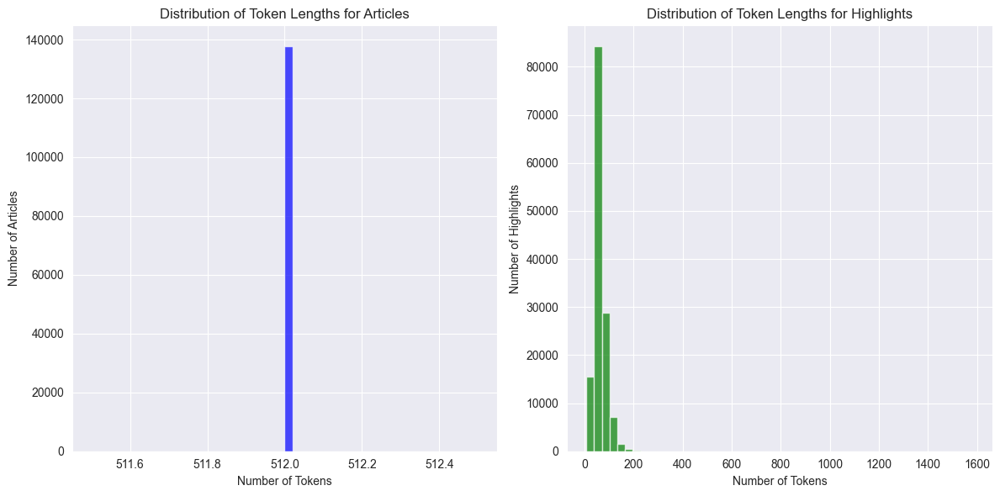

In [36]:
import matplotlib.pyplot as plt

# Extracting the total token lengths of articles and the lengths of highlights

# Sum the lengths of all segments for each article to get total article length
article_lengths = [sum(segment.shape[1] for segment in entry['bert_input_segments']) for entry in tokenized_data]

# For highlights, get the token lengths
highlight_lengths = [entry['gpt2_input_ids'].shape[1] for entry in tokenized_data]

# Plotting the distribution
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(article_lengths, bins=50, color='blue', alpha=0.7)
plt.title("Distribution of Token Lengths for Articles")
plt.xlabel("Number of Tokens")
plt.ylabel("Number of Articles")

plt.subplot(1, 2, 2)
plt.hist(highlight_lengths, bins=50, color='green', alpha=0.7)
plt.title("Distribution of Token Lengths for Highlights")
plt.xlabel("Number of Tokens")
plt.ylabel("Number of Highlights")

plt.tight_layout()
plt.show()


In [37]:
from collections import Counter

# Initialize the BERT tokenizer
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Extract tokens from tokenized_data
tokens = []
for entry in tokenized_data:
    for segment in entry['bert_input_segments']:
        tokens.extend(bert_tokenizer.convert_ids_to_tokens(segment[0]))  # Decoding token IDs to tokens

# Use Counter to get token frequencies
token_counts = Counter(tokens)

# Get the most common tokens
num_common_tokens = 10
most_common_tokens = token_counts.most_common(num_common_tokens)

print(most_common_tokens)


[('[PAD]', 3572623), ('.', 3069261), ('the', 3055774), (',', 2521062), ('to', 1393461), ('a', 1334559), ('of', 1226528), ("'", 1224017), ('and', 1177674), ('in', 1125973)]


## Training the model


In [71]:
def gen():
    for entry in tokenized_data:
        yield entry['input_segments'], entry['attention_masks'], entry['gpt2_input_ids']

def map_function(input_segments, attention_masks, gpt2_input_ids):
    return (
        {
            "input_segments": input_segments,
            "attention_masks": attention_masks
        },
        gpt2_input_ids
    )

dataset = tf.data.Dataset.from_generator(
    gen, 
    output_signature=(
        tf.TensorSpec(shape=(None, None, 512), dtype=tf.int32),
        tf.TensorSpec(shape=(None, None, 512), dtype=tf.int32),
        tf.TensorSpec(shape=(512,), dtype=tf.int32)
    )
)
dataset = dataset.map(map_function)
dataset = dataset.batch(8)  # Retain batch size of 8 as an example. Adjust as necessary.
dataset = dataset.shuffle(buffer_size=1000).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [72]:
dataset

<PrefetchDataset element_spec=({'input_segments': TensorSpec(shape=(None, None, None, 512), dtype=tf.int32, name=None), 'attention_masks': TensorSpec(shape=(None, None, None, 512), dtype=tf.int32, name=None)}, TensorSpec(shape=(None, 512), dtype=tf.int32, name=None))>